In [346]:
import pandas as pd

import importlib, csiro_biomass_shared_utils as csiro_su
importlib.reload(csiro_su)

pd.set_option('display.expand_frame_repr', False)  # don't split into blocks
pd.set_option('display.width', 200)               # or None for auto / very wide
pd.set_option('display.max_columns', None)        # show all columns

In [347]:
import os

# List all attached datasets
print(os.listdir("/kaggle/input/csiro-biomass"))

['sample_submission.csv.0', 'sample_submission.csv', 'sample_submission.csv_ref', 'train.csv', 'test.csv', 'train_intermediate.csv', 'sample_submission.csv_bak', 'csiro-biomass.zip', 'test', 'train']


In [348]:
all_cols = ["sample_id", "Species", "Pre_GSHH_NDVI", "Height_Ave_cm",
        "Dry_Clover_g", "Dry_Dead_g",
        "Dry_Green_g", "Dry_Total_g", "GDM_g"]

## Overall Data

In [349]:
import os, cv2
import numpy as np
from sklearn.model_selection import train_test_split

def prepare_data(data_root, in_csv_fl):
    # ---------------------------------
    # Read the data from CSV
    train_df = pd.read_csv(f"{data_root}/{in_csv_fl}")
    # print(f"INPUT:\n{train_df}")

    cols_to_drop = ["State", "Sampling_Date", "image_path"]
    biomass_cols_order = ["Dry_Clover_g", "Dry_Dead_g", "Dry_Green_g", "Dry_Total_g", "GDM_g"]
        
    train_df = train_df.drop(columns=cols_to_drop)
    # print(train_df)

    # Change the sample_id to have just ID and nothing else
    train_df["sample_id"] = train_df["sample_id"].str.split("__").str[0]

    train_pivot = (
        train_df.pivot_table(
            index=["sample_id", "Species", "Pre_GSHH_NDVI", "Height_Ave_cm"],
            columns="target_name",
            values="target"
        ).reset_index()
    )

    train_pivot = train_pivot.rename_axis(columns=None)

    # ensure biomass columns are in a fixed order
    train_pivot = train_pivot [
        ["sample_id", "Species", "Pre_GSHH_NDVI", "Height_Ave_cm"] + biomass_cols_order
    ]

    return train_pivot.reset_index(drop=True)

In [350]:
data_root = "/kaggle/input/csiro-biomass"
in_csv_fl="train.csv"

train_df = pd.read_csv(f"{data_root}/{in_csv_fl}")
print(train_df)

full_df = prepare_data(data_root=data_root, in_csv_fl=in_csv_fl)
print(full_df)

                       sample_id              image_path Sampling_Date State          Species  Pre_GSHH_NDVI  Height_Ave_cm   target_name   target
0     ID1011485656__Dry_Clover_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667  Dry_Clover_g   0.0000
1       ID1011485656__Dry_Dead_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667    Dry_Dead_g  31.9984
2      ID1011485656__Dry_Green_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667   Dry_Green_g  16.2751
3      ID1011485656__Dry_Total_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667   Dry_Total_g  48.2735
4            ID1011485656__GDM_g  train/ID1011485656.jpg      2015/9/4   Tas  Ryegrass_Clover           0.62         4.6667         GDM_g  16.2750
...                          ...                     ...           ...   ...              ...            ...          

## Regression data range

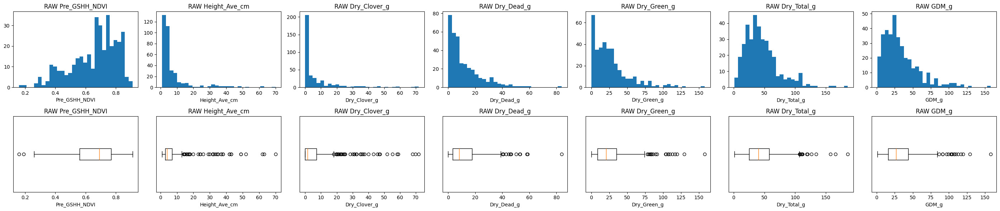

In [351]:
cols = ["Pre_GSHH_NDVI", "Height_Ave_cm",
        "Dry_Clover_g", "Dry_Dead_g",
        "Dry_Green_g", "Dry_Total_g", "GDM_g"]

csiro_su.plot_distributions(full_df, cols)

## **NDVI (Pre_GSHH_NDVI)**

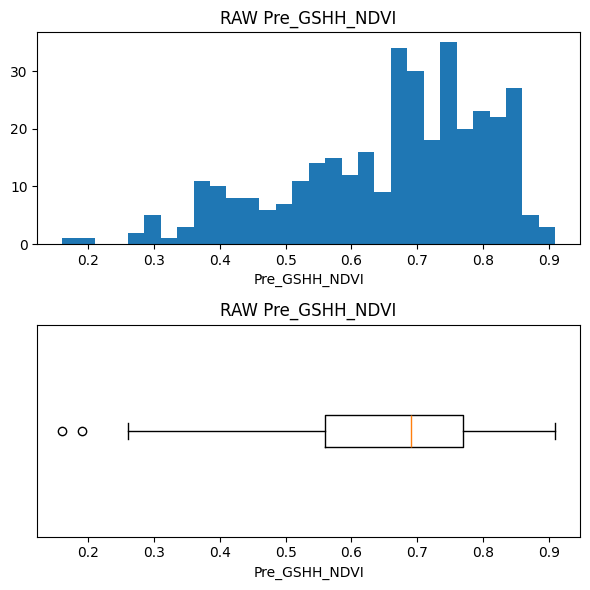

In [352]:
col_Dry_Clover_g = ["Pre_GSHH_NDVI"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

* **Most samples have high NDVI.**
  The histogram mass is mainly around **~0.65 to ~0.85**, which typically indicates **healthy/green vegetation** (more canopy/greenness).

* **There are a few very low-NDVI outliers.**
  The boxplot shows **2–3 points around ~0.15–0.2** far below the rest, likely **bare soil / shadows / dead vegetation / image/label issues / wrong ROI**. These are worth visually inspecting.

* **Central tendency is around ~0.7.**
  The median line in the boxplot is roughly **~0.70**.

* **Spread is moderate with a longer tail to the low side (left-skew / negative skew).**
  The left whisker is long (down to ~0.25-ish) compared to the right side. That means variability is mainly from occasional low NDVI samples.

* **No need for log1p on NDVI.**
  NDVI is already **bounded** (roughly $[-1, 1]$; here ~0.15–0.9) and not a “heavy-tailed positive” variable like biomass. Log transforms are usually for long-right-tail variables; this one doesn’t look like that.

Next steps:

* **Flag low NDVI** (e.g., `< 0.25`) and inspect those images/metadata.
* If they’re genuine cases, keep them; if they’re artifacts, you can **remove** or **cap** them, or treat them as a separate “bad capture” category.


        sample_id            Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g    GDM_g
0    ID1011485656    Ryegrass_Clover           0.62         4.6667        0.0000     31.9984      16.2751      48.2735  16.2750
1    ID1012260530            Lucerne           0.55        16.0000        0.0000      0.0000       7.6000       7.6000   7.6000
2    ID1025234388  SubcloverDalkeith           0.38         1.0000        6.0500      0.0000       0.0000       6.0500   6.0500
3    ID1028611175           Ryegrass           0.66         5.0000        0.0000     30.9703      24.2376      55.2079  24.2376
4    ID1035947949           Ryegrass           0.54         3.5000        0.4343     23.2239      10.5261      34.1844  10.9605
..            ...                ...            ...            ...           ...         ...          ...          ...      ...
352   ID975115267             Clover           0.73         3.0000       40.0300      0.0000       0.800

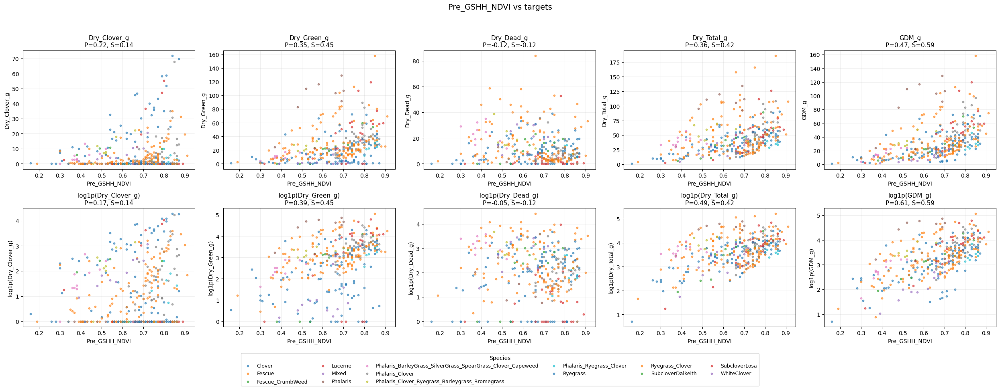

In [353]:
print(full_df)
csiro_su.print_biomass_2xN(full_df, target_col="Pre_GSHH_NDVI", hue_col="Species",
                y_cols=("Dry_Clover_g", "Dry_Green_g","Dry_Dead_g","Dry_Total_g","GDM_g"))
                # y_cols=("Dry_Total_g","GDM_g"))

### 1) Observations

* **NDVI relates strongly to “green/total mass”, weakly to clover, and almost not to dead biomass.**
  Strength order (from the plots): **GDM_g strongest**, then **Dry_Total_g ≈ Dry_Green_g**, then **Dry_Clover_g weak**, **Dry_Dead_g ~ none / slight negative**.
* **Large spread at high NDVI (~0.7–0.9)** → NDVI “tops out” (saturation): many samples look equally green but biomass still varies.
* **Species colors spread differently at the same NDVI** → clear **species interaction**: same NDVI can mean different biomass depending on species mix.

### 2) Effect of `log1p`

* `log1p` **cleans up** the relationship for **Dry_Green_g, Dry_Total_g, and especially GDM_g** (less dominated by large values; points look more linear/tighter).
* `log1p` **does not fix** **Dry_Clover_g** much because the main issue is **many zeros + occasional spikes** (zero-inflation).
* `log1p` **does not help** **Dry_Dead_g** because NDVI simply isn’t strongly tied to dead material.

### 3) Inference

* Keep **NDVI raw** (don’t log it). Apply `log1p` to **GDM_g, Dry_Total_g, Dry_Green_g**; consider special handling for **Dry_Clover_g** (presence/absence + amount) and accept weaker predictability for **Dry_Dead_g**.
* Because **species changes the NDVI→biomass mapping**, include **species conditioning** in the model (species embedding, or separate heads per species group, or explicit interaction like `NDVI × species_embedding`).
* Expect NDVI to be a **good baseline predictor** for total/green biomass, but to reach high accuracy you’ll need **image features (texture/coverage)** to resolve the wide spread at high NDVI.


2
        sample_id          Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
179  ID1963715583           Clover           0.16            1.0          0.34         0.0          0.7         1.04   1.04
347   ID956512130  Ryegrass_Clover           0.19            1.0          0.00         1.9          2.4         4.30   2.40


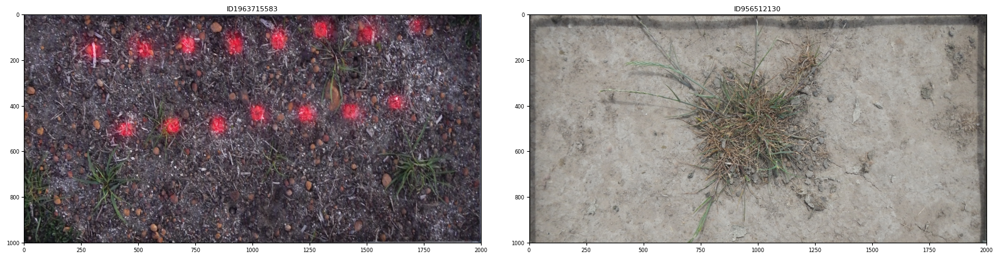

In [354]:
low_ndvi_df = full_df[full_df["Pre_GSHH_NDVI"] < 0.25]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])


train_imgs_dir_pth = "/kaggle/input/csiro-biomass/"

csiro_su.show_images_grid(
    low_ndvi_df["sample_id"],
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24
)

Before : 357
1
       sample_id          Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
346  ID956512130  Ryegrass_Clover           0.19            1.0           0.0         1.9          2.4          4.3    2.4


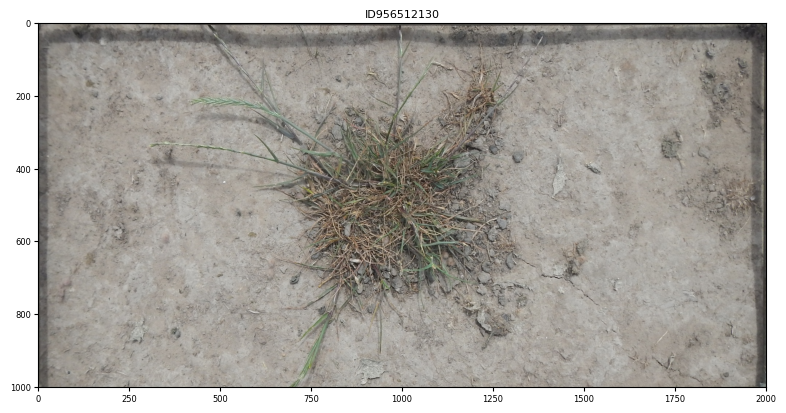

After : 356


In [355]:
print(f"Before : {len(full_df)}")

# REmove ID1963715583
bad_id = "ID1963715583"   # the one with the red dots
full_df = full_df[full_df["sample_id"] != bad_id].reset_index(drop=True)

low_ndvi_df = full_df[full_df["Pre_GSHH_NDVI"] < 0.25]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])

train_imgs_dir_pth = "/kaggle/input/csiro-biomass/"

csiro_su.show_images_grid(
    low_ndvi_df["sample_id"],   # or .tolist()
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24
)

print(f"After : {len(full_df)}")

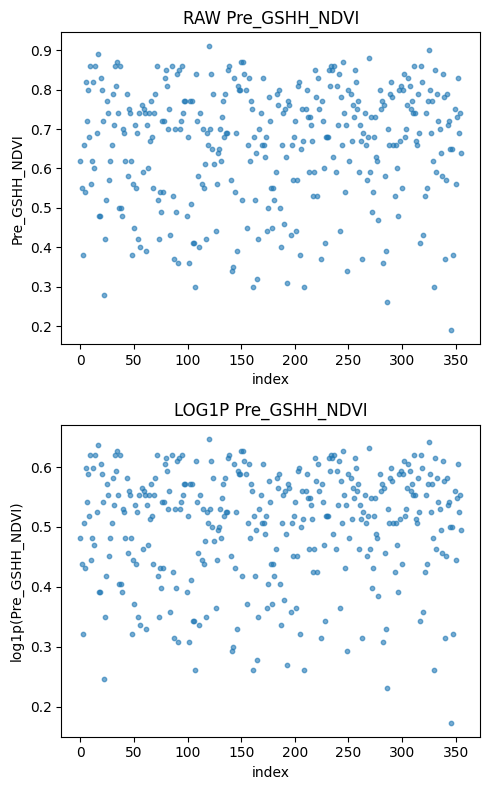

In [356]:
# Example (your columns)
cols = ["Pre_GSHH_NDVI"]

csiro_su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

From this plot (RAW vs LOG1P for **Pre_GSHH_NDVI**), the takeaway is simple:

* **NDVI is already bounded and well-behaved** (roughly ~0.2 to ~0.9 here). It doesn’t have the “long right tail” problem that log transforms are meant to fix.
* Applying `log1p` **just compresses the scale** (high values get squished more than low values) but **the pattern doesn’t improve**—it’s basically the same scatter, just re-labeled.
* **Inference:** **Do NOT `log1p` NDVI.** Keep NDVI as-is (maybe only normalize/standardize if your model benefits), and reserve `log1p` for biomass targets like **Dry_Total_g / GDM_g / Dry_Green_g**.

> Use `log1p` for positive heavy-tailed targets; do **not** log-transform bounded indices like NDVI.


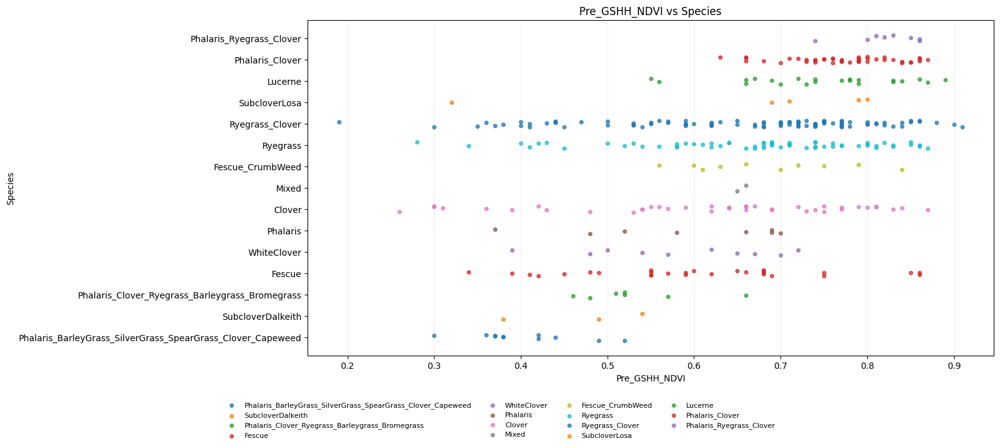

In [357]:

csiro_su.ndvi_vs_species_hscatter(full_df, ndvi_col="Pre_GSHH_NDVI", species_col="Species")


### 1) Key observations from **NDVI vs Species**

* **NDVI is species-dependent.** Some species/groups (e.g., **Lucerne**, **Phalaris_Clover**) cluster mostly at **high NDVI (~0.65–0.9)**, while others (e.g., **Ryegrass_Clover**, **Clover**) span a **much wider NDVI range (~0.3–0.9)**.
* **Within-species variability differs a lot.** “Mixture” labels like **Ryegrass_Clover** show broad spread, suggesting they cover multiple field conditions (sparse → dense canopy).
* **Low-NDVI pockets exist but are not uniform across species.** A few labels contain most of the very low NDVI samples (~0.2–0.4), which are potential edge cases/outliers.

### 2) Data preparation takeaways

* **Stratify by Species × NDVI** when splitting train/val/test (or during sampling) so each split has similar coverage of NDVI ranges *within each species*. Otherwise validation can look “easy” or “hard” just because NDVI distribution shifted.
* **Audit the low-NDVI tails per species.** For each species, inspect the bottom NDVI samples (e.g., lowest 5–10%) using your image grid—these are where capture issues or label noise usually hide.
* **Handle rare species / imbalanced groups.** Some species clearly have fewer points; consider oversampling/weights so the model doesn’t ignore them (especially if they matter for deployment).

### 3) Modeling takeaways

* **Model needs species conditioning.** Since NDVI distributions differ by species, the mapping from image features → targets is also species-specific. Use a **species embedding** (or species as an input feature) so the model can learn different “NDVI-to-biomass” regimes per species.
* **Expect different difficulty by species.** Tight NDVI clusters (consistent species) are easier; wide-spread mixture labels are harder. Consider **per-species metrics** (R² / MAE) so you don’t get fooled by overall averages.
* **Interaction matters:** include an interaction mechanism like **(image features ⊕ species embedding)** or explicitly **NDVI × species_embedding** in simpler models, because the same NDVI level can correspond to different biomass depending on species mix.


3
        sample_id          Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
22   ID1119739385         Ryegrass           0.28            4.0           0.0         3.0          6.8          9.8    6.8
286   ID661372352           Clover           0.26            1.0           0.0         0.0         10.4         10.4   10.4
346   ID956512130  Ryegrass_Clover           0.19            1.0           0.0         1.9          2.4          4.3    2.4


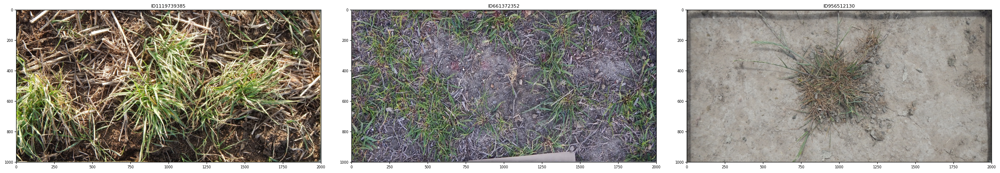

In [358]:
low_ndvi_df = full_df[full_df["Pre_GSHH_NDVI"] < 0.3]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])


train_imgs_dir_pth = "/kaggle/input/csiro-biomass/"

csiro_su.show_images_grid(
    low_ndvi_df["sample_id"],
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24
)

### 1) Data preparation must-dos

* **Stratify splits by `Species × NDVI-band`** (e.g., NDVI bins like `<0.3, 0.3–0.5, 0.5–0.7, >0.7`) so train/val/test have similar coverage **within each species**. This prevents “validation surprise” from distribution shift.
* **Audit and tag the low-NDVI tail** (e.g., NDVI < 0.25 or bottom 5–10% per species) using your image grid. Either -   
(a) remove clear capture/label errors, or   
(b) keep them but mark as “edge cases” and ensure they exist in all splits.

### 2) Modeling must-dos

* **Condition the model on species** (species embedding / one-hot → fused with image features). Your plots show the NDVI/biomass mapping changes by species, so the model needs that context.
* **Use log1p targets where it helps**: apply `log1p` to **GDM_g / Dry_Total_g / Dry_Green_g**; keep **NDVI raw**. For **Dry_Clover_g**, consider a **two-stage (hurdle) setup**: predict “clover present?” + “clover amount” (only when present), because the raw scatter is zero-inflated.

### 3) Loss function changes (only if you want extra gains)

* **Use a robust regression loss for biomass heads** (e.g., Huber/SmoothL1) on the `log1p` scale to reduce the impact of rare large spikes.
* If you implement the clover hurdle:

  * add **BCE loss** for presence/absence + **regression loss** for amount (masked to non-zero cases).
* **Track per-species metrics** (not a loss, but essential): report R²/MAE per species (and per NDVI bin) so improvements aren’t hidden by dominant species like Ryegrass_Clover.


## **Height (Height_Ave_cm)**

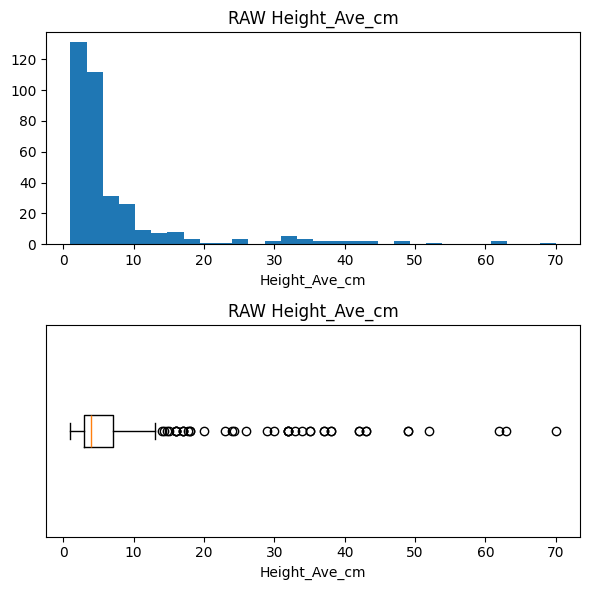

In [359]:
# cols = ["Pre_GSHH_NDVI", "Height_Ave_cm",
#         "Dry_Clover_g", "Dry_Dead_g",
#         "Dry_Green_g", "Dry_Total_g", "GDM_g"]

col_Dry_Clover_g = ["Height_Ave_cm"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

* **Most samples are short (heavy mass near the low end).** The histogram is strongly concentrated around roughly **~2–8 cm**, meaning most plots are low canopy height.
* **Height is strongly right-skewed (long tail to high values).** You have a small number of **very tall** samples extending all the way to **~70 cm**.
* **Central tendency is low.** The box (IQR) sits in the low single digits; median looks around **~4–5 cm** (roughly), consistent with the histogram peak.
* **Lots of outliers on the high side.** The boxplot shows many points beyond the upper whisker (above ~10–15 cm onward), so “tall” cases are rare but frequent enough to matter.
* **This is the classic shape where log1p *can* help (unlike NDVI).** Height is **positive + heavy-tailed**, so log1p can compress extreme heights and make modeling/optimization easier if your loss is sensitive to big values.

**Next steps (practical):**

* **Inspect the extreme-height tail** (e.g., top 1–5%: >40–70 cm). Confirm they’re real (species like Lucerne can be tall) vs measurement/entry errors.
* **Decide transform strategy:**

  * If you train with MSE/MAE directly on height, consider **log1p(height)** (or at least standardize robustly) to reduce domination by tall outliers.
  * If you need interpretability in cm, you can still **predict log1p** and inverse with `expm1`.
* **Stratify splits by height bins** (low/medium/high) so train/val/test all contain some tall cases—otherwise evaluation can swing wildly depending on whether the rare tall tail lands in one split.

**Height = positive heavy tail → log1p is reasonable (after sanity-checking outliers).**


        sample_id            Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g    GDM_g
0    ID1011485656    Ryegrass_Clover           0.62         4.6667        0.0000     31.9984      16.2751      48.2735  16.2750
1    ID1012260530            Lucerne           0.55        16.0000        0.0000      0.0000       7.6000       7.6000   7.6000
2    ID1025234388  SubcloverDalkeith           0.38         1.0000        6.0500      0.0000       0.0000       6.0500   6.0500
3    ID1028611175           Ryegrass           0.66         5.0000        0.0000     30.9703      24.2376      55.2079  24.2376
4    ID1035947949           Ryegrass           0.54         3.5000        0.4343     23.2239      10.5261      34.1844  10.9605
..            ...                ...            ...            ...           ...         ...          ...          ...      ...
351   ID975115267             Clover           0.73         3.0000       40.0300      0.0000       0.800

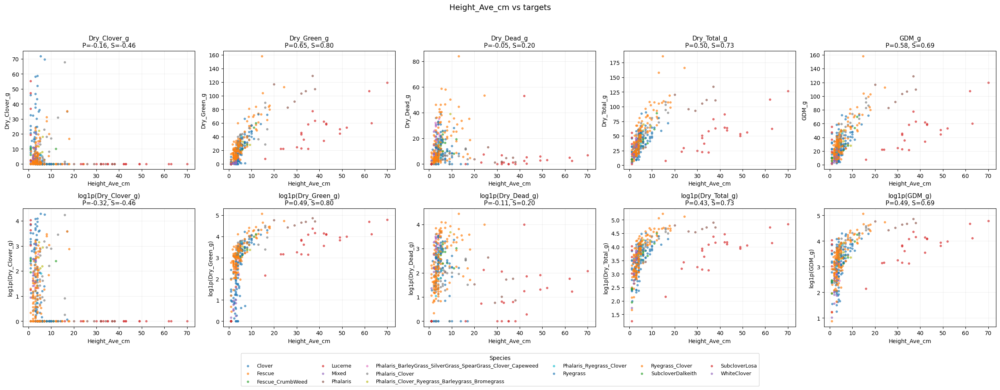

In [360]:
print(full_df)
csiro_su.print_biomass_2xN(full_df, target_col="Height_Ave_cm", hue_col="Species",
                y_cols=("Dry_Clover_g", "Dry_Green_g","Dry_Dead_g","Dry_Total_g","GDM_g"))

#### 1) What the graphs *quantitatively* show (Observations)

* **Height is a strong signal for green/total biomass.**
  From the *Height_Ave_cm vs targets* plots:

  * **Dry_Green_g:** Pearson **$r \approx 0.65$**, Spearman **$\rho \approx 0.80$**
  * **Dry_Total_g:** Pearson **$r \approx 0.50$**, Spearman **$\rho \approx 0.73$**
  * **GDM_g:** Pearson **$r \approx 0.58$**, Spearman **$\rho \approx 0.69$**
    Interpretation: as height increases, green/total/GDM increase reliably (strong monotonic trend, especially Spearman).

* **Height is weak / not useful for Dead biomass (and not clean for Clover).**

  * **Dry_Dead_g:** Pearson **$r \approx -0.05$** (≈ no linear relation), Spearman **$\rho \approx 0.20$** (very weak monotonic relation)
  * **Dry_Clover_g:** Pearson **$r \approx -0.16$**, Spearman **$\rho \approx -0.46$** (this negative $\rho$ is typically a “data-shape” effect: many zeros + mixed species patterns rather than a stable physical rule)

* **Height distribution is highly right-skewed (long tail).**
  From the histogram + boxplot:

  * Typical height mass is around **$\sim 2$ to $10$ cm** (dense region).
  * There is a long tail with many outliers **>$15–20$ cm**, reaching roughly **$\sim 70$ cm**.
    Practical meaning: rare tall samples can dominate training unless handled.

#### 2) Data preparation actions (must do)

* **Handle the long-tail in Height explicitly (because max $\sim 70$ cm, bulk $\sim 2–10$ cm).**
  Recommended: **clip** height at a high percentile (e.g., 99th / 99.5th) *or* use **robust scaling** (median/IQR) so the rare tall cases don’t dominate gradients.

* **Audit the extreme-height tail.**
  Since heights go up to **$\sim 70$ cm** while most are **$\lt 10$ cm**, visually inspect the **top 1–5% tallest** samples using your image grid to confirm they are valid (not ROI/label issues).

* **Stratify splits by Species × Height buckets.**
  Because relationships differ by species (clear color separation in the scatter), ensure train/val/test have similar **height coverage within each species** to avoid distribution shift.

#### 3) Modeling + Loss (what must change)

**Modeling (must do)**

* **Use species conditioning + interaction with height.**
  Since the height→biomass mapping is species-dependent, feed **species embedding** and let the model learn interactions like **Height × SpeciesEmbedding** (or fuse height + species embedding before biomass heads).
  This is especially important because even with strong overall correlations (e.g., **Dry_Green: $\rho \approx 0.80$**), the slope/band differs by species.

* **Expect best results on Green/Total/GDM; expect lower ceiling on Dead/Clover from height alone.**
  Supported by correlations:

  * Strong: **Dry_Green ($r\approx0.65,\ \rho\approx0.80$)**, **Dry_Total ($r\approx0.50,\ \rho\approx0.73$)**, **GDM ($r\approx0.58,\ \rho\approx0.69$)**
  * Weak: **Dry_Dead ($r\approx-0.05,\ \rho\approx0.20$)**
    Therefore, dead/clover predictions must rely more on **image texture/coverage cues** than height.

**Loss / objective (only if required, but recommended given the plot shapes)**

* **Clover likely needs a hurdle-style loss (because it looks zero-inflated).**
  Instead of a single regression:

  1. **presence/absence** (BCE) +
  2. **amount given present** (regression, often on log1p scale)

* **Use a robust regression loss for biomass heads (to reduce tail dominance).**
  Given heavy tails (both height and biomass), prefer **Huber / SmoothL1** (or capped weights) so extreme points don’t dominate training.

* **Track per-species metrics.**
  Because the mapping changes by species, compute **per-species R²/MAE** in addition to overall metrics (otherwise strong species can hide weak ones).

6
        sample_id  Species  Pre_GSHH_NDVI  Height_Ave_cm  Dry_Clover_g  Dry_Dead_g  Dry_Green_g  Dry_Total_g  GDM_g
66   ID1357758282  Lucerne           0.77           62.0           0.0         4.8        107.3        112.1  107.3
96    ID147528735  Lucerne           0.74           52.0           0.0         3.0         53.5         56.5   53.5
157  ID1859251563  Lucerne           0.83           70.0           0.0         6.9        119.6        126.5  119.6
264   ID554314721  Lucerne           0.69           49.0           0.0         2.7         50.9         53.6   50.9
271   ID576621307  Lucerne           0.73           63.0           0.0         2.4         60.2         62.6   60.2
288   ID663006174  Lucerne           0.66           49.0           0.0         5.8         44.6         50.4   44.6


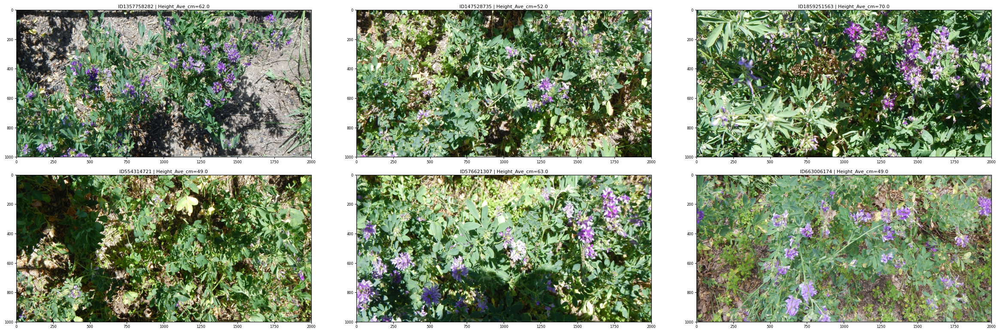

In [361]:
low_ndvi_df = full_df[full_df["Height_Ave_cm"] > 45]
print(len(low_ndvi_df))
print(low_ndvi_df[all_cols])

# csiro_su.show_images_grid(low_ndvi_df["sample_id"], df=low_ndvi_df, title_col=["Height_Ave_cm"])

csiro_su.show_images_grid(
    low_ndvi_df["sample_id"],
    base_dir=train_imgs_dir_pth,
    split="train",
    cols=3,
    max_images=24,
    df=low_ndvi_df,
    title_col="Height_Ave_cm"
)

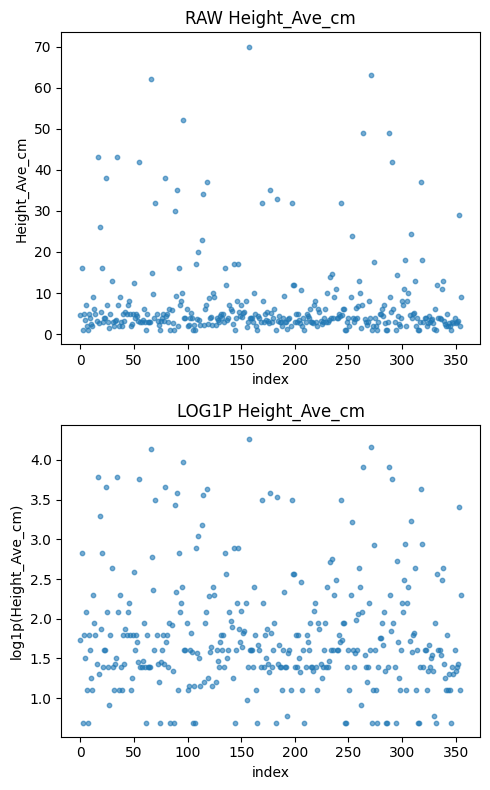

In [362]:
# Example (your columns)
cols = ["Height_Ave_cm"]

csiro_su.scatter_raw_and_log1p_one_row(full_df, cols, max_points=5000)

From this **RAW vs LOG1P Height_Ave_cm** plot, the takeaway **(treating height as an *input feature*, not a target)** is:

* **Height is strongly right-skewed (long right tail).** Most samples sit in roughly the **~0–10 cm** band, but there are **rare tall outliers up to ~70 cm**. If you feed raw height directly, those few extreme values can disproportionately influence the model (especially early training / for the MLP part).

* **`log1p(height)` does what it should here: compresses the tail.** Large heights get squashed much more than small heights, so the **~70 cm** points stop “dominating” the numeric range. This often makes the feature easier for the model to use because the bulk of the data gets more resolution.

* **Practical recommendation (for inputs): pick one of these and then standardize**

  * **Option A (simple + interpretable):** keep **Height in cm**, **clip/winsorize** extreme highs (e.g., cap at a high percentile), then **z-score normalize**.
  * **Option B (often works well):** use **`log1p(Height)`**, then **z-score normalize**.

* **Modeling hint (most important): height is species-dependent.** Even with perfect scaling, the same height can map to different biomass for different species, so feed height **together with species** (e.g., concatenate `[image_features, height_feature, species_embedding]`, and ideally include an interaction like `height_feature × species_embedding`).


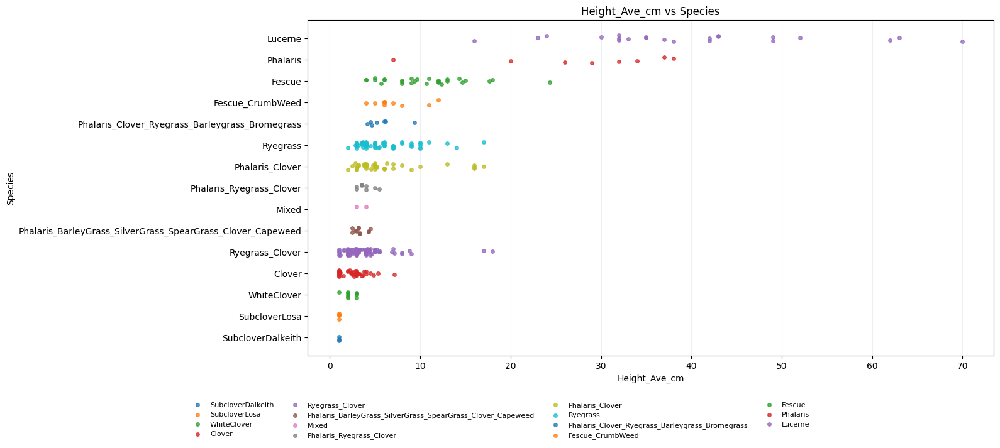

In [363]:
csiro_su.ndvi_vs_species_hscatter(full_df, ndvi_col="Height_Ave_cm", species_col="Species")

## Height (Height_Ave_cm) — consolidated observations + must-do notes

### 1) What the graphs *quantitatively* show (Observations)

* **Height is extremely right-skewed (long tail).** Most samples are in the **~0–10 cm** band (hist peak roughly **~2–8 cm**). The **median is ~4–5 cm** (boxplot). But there are **rare tall outliers up to ~70 cm**, and many points beyond the upper whisker (roughly **>10–15 cm** onward).
* **Height is a strong signal for green/total biomass (and GDM), but not for dead/clover.** From *Height vs targets* plots:

  * **Dry_Green_g:** Pearson **~0.65**, Spearman **~0.80** (strong + monotonic)
  * **Dry_Total_g:** Pearson **~0.50**, Spearman **~0.73** (moderate/strong + monotonic)
  * **GDM_g:** Pearson **~0.58**, Spearman **~0.69** (moderate/strong + monotonic)
  * **Dry_Dead_g:** Pearson **~−0.05**, Spearman **~0.20** (basically weak / near-none)
  * **Dry_Clover_g:** Pearson **~−0.16**, Spearman **~−0.46** (negative/unstable; typically “data-shape” driven: many zeros + species effects)
* **Height is species-dependent (distribution shift by species).** In *Height vs Species*, **Lucerne** (and some **Phalaris**) spans much larger heights (reaching **~70 cm**), while many others cluster mostly **<~10–15 cm**. So the meaning of “20 cm” is **not comparable across species** unless the model knows the species.

### 2) Data preparation must-dos (what you must do)

* **Audit the extreme-height tail (top ~1–5%) per species.**
  Because heights go to **~70 cm** while the bulk is **~0–10 cm**, those tall cases can be: (a) real (e.g., Lucerne), or (b) capture/ROI/label issues. Use your image grid to sanity-check those samples.
* **Stratify splits by `Species × Height-bin` (not just random split).**
  If one split accidentally gets more tall-Lucerne cases, validation/test will swing even if the model didn’t change. Make height bins inside each species (example bins: **0–3**, **3–7**, **7–15**, **15+ cm**) and stratify within species.
* **Treat height as a “heavy-tail” numeric feature during scaling.**
  Since you’re **not predicting height** (it’s an input feature), the goal is to stop rare tall values from dominating the numeric scale:

  * Prefer **robust scaling** (median/IQR) over mean/std, **or**
  * Apply **log1p(height)** *as an input feature transform*, then standardize (this compresses the **0–70 cm** tail while preserving ordering).
    Either way, you keep interpretability because you can always log/inverse only internally—your targets stay unchanged.

### 3) Modeling + loss function hints (what to do)

**Modeling (must-do)**

* **Feed Height + Species together (interaction is mandatory).**
  Because height ranges and “height → biomass” mapping change by species, concatenate something like:
  `fused = [image_features, height_feature, species_embedding]`
  and let the head learn the interaction (or explicitly include an interaction like `height_feature ⊙ species_embedding`).
* **Expect strongest gains on Dry_Green / Dry_Total / GDM; weaker ceiling on Dead/Clover.**
  This is directly supported by correlations:

  * Strong: Dry_Green (**~0.65 / ~0.80**), Dry_Total (**~0.50 / ~0.73**), GDM (**~0.58 / ~0.69**)
  * Weak: Dry_Dead (**~−0.05 / ~0.20**)
  * Clover is messy/zero-inflated and species-dependent (negative Spearman **~−0.46** in your plot).

**Loss / objective (only change if you want extra gains, but recommended)**

* **Use robust regression loss for biomass heads** (Huber/SmoothL1) on your **log1p-transformed biomass targets** (Dry_Green/Dry_Total/GDM etc.). This reduces the effect of rare large spikes/outliers (which your plots clearly show exist in both biomass and height-related regimes).
* **If Clover is truly zero-inflated:** use a **two-stage (hurdle) loss**

  1. BCE for `clover_present`
  2. regression loss for `clover_amount` (only on present cases, often on log1p scale)
* **Track per-species metrics** (R²/MAE per species, optionally per height-bin). Otherwise dominant species can hide failures on rare species/tall regimes.

If you want, I can format the above into the exact same “NDVI section” style you used earlier (same headings + “Next steps” block), but the content here is already copy-ready.


# **Species**

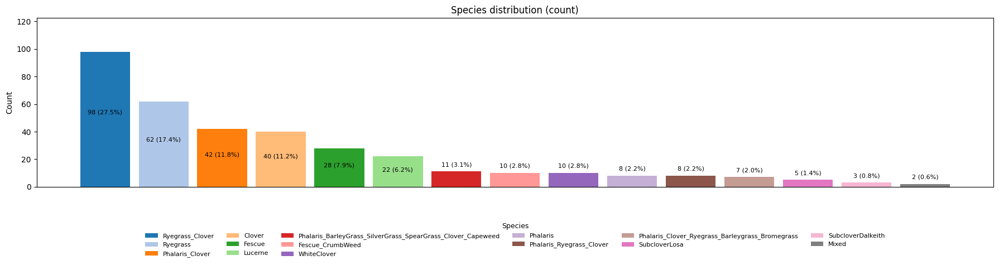

In [364]:
# usage
counts, pct = csiro_su.species_distribution_count(full_df)


### Species

#### What the plots + counts *concretely* show

Your dataset is **dominated by a few species**, and both **Height** and **NDVI** behave differently across species—so the same numeric value does **not** imply the same biomass across the dataset.

* **Imbalance is large:** top-4 species already cover **~67.9%** of data

  * Ryegrass_Clover: **98 (27.5%)**
  * Ryegrass: **62 (17.4%)**
  * Phalaris_Clover: **42 (11.8%)**
  * Clover: **40 (11.2%)**
    Meanwhile, multiple species have **≤ 5 samples** (**1.4%**, **0.8%**, **0.6%**) → they will be ignored by default training unless you intervene.

* **Height is species-dependent:** the **~70 cm** extreme heights come mostly from **Lucerne** (and some **Phalaris**) while many other species live mostly around **~0–10/15 cm**.
  Practical meaning: **20 cm** is not “equivalent canopy” across species.

* **Height→biomass is strong for green/total/GDM but weak for dead/clover (overall):**

  * Dry_Green: **Pearson ≈ 0.65**, **Spearman ≈ 0.80**
  * Dry_Total: **Pearson ≈ 0.50**, **Spearman ≈ 0.73**
  * GDM: **Pearson ≈ 0.58**, **Spearman ≈ 0.69**
  * Dry_Dead: **Pearson ≈ −0.05**, **Spearman ≈ 0.20** (near-no relationship)
  * Dry_Clover: **Pearson ≈ −0.16**, **Spearman ≈ −0.46** (not a stable physical rule; driven by zeros + species effects)

**Key implication:** those correlation numbers are “global” and will be **dominated by the big species** (Ryegrass_Clover/Ryegrass). Per-species slopes can differ, so the model must know the species.


## Practical must-dos (data prep → model → loss), without the wall of bullets

### 1) Data prep (prevent misleading validation + reduce imbalance bias)

**Split in a species-aware way**: do **Species × NDVI-bin × Height-bin** stratification (within species).
Reason: because tall heights are concentrated in a few species (Lucerne/Phalaris), a random split can accidentally put more tall-Lucerne in one split and your validation will “move” even if the model didn’t improve.

**Handle imbalance explicitly** (because top-4 = **67.9%**):

* Use either a **WeightedRandomSampler** or **species-weighted loss**, where weight is roughly `1 / count(species)` (clip the maximum weight so tiny species don’t dominate).
* Otherwise training will mostly optimize **Ryegrass_Clover (27.5%)** and **Ryegrass (17.4%)**, and rare species will look bad at deployment.

**Treat height as a heavy-tailed input feature** (you’re not predicting height, but it still affects learning):

* Because height has rare values up to **~70 cm**, prefer **robust scaling** (median/IQR) or **log1p(height) then standardize** so a few tall points don’t dominate the numeric range.


### 2) Modeling (make species a conditioning variable + allow interactions)

**Species conditioning is not optional** here. Use a **species embedding** and fuse it with image + NDVI + height:

* `fused = [image_features, ndvi, height_feature, species_emb]`

Then make it easier for the network to learn *species-specific slopes* by adding interaction capacity:

* simplest: an MLP that takes `[ndvi, height, species_emb]` together
* better (often): explicitly include `height * species_emb` and `ndvi * species_emb` as extra inputs

This directly targets the reality shown in your plots: “same height/NDVI → different biomass depending on species.”


### 3) Loss / targets (match your target behavior)

Your own plots already support:

* Use **log1p** targets for **Dry_Green_g, Dry_Total_g, GDM_g** (tightens the relationship and reduces spike dominance).
* **Dry_Dead_g**: expect a lower ceiling from structured features (since correlation is ~**−0.05 / 0.20**); you’ll rely more on image texture cues.
* **Dry_Clover_g**: treat as **zero-inflated**; log1p alone won’t fix the “many zeros + occasional spikes” pattern.

So for stability:

* Use **SmoothL1/Huber** for the regression heads (on transformed scale), to reduce sensitivity to rare spikes.
* If Clover matters, the best-behaving setup is often a **hurdle**:

  * BCE for `clover_present`
  * regression for `clover_amount` only when present

Finally, **species-balanced training signal**:

* Either weight per-sample loss by `1/count(species)` (clipped), or compute loss per species and average (macro-loss). This prevents the top species (67.9% in top-4) from deciding everything.

### 4) Evaluation (so you don’t get fooled)

Always report **overall + per-species** metrics.
With your distribution, a good overall $R^2$ can mostly mean “good on Ryegrass_Clover/Ryegrass” while rare species silently fail.

If you want the most informative minimal set:

* overall $R^2$/MAE
* per-species $R^2$/MAE
* optionally per-species within height bins (because tall tail is species-driven)


## **Dry_Clover_g**

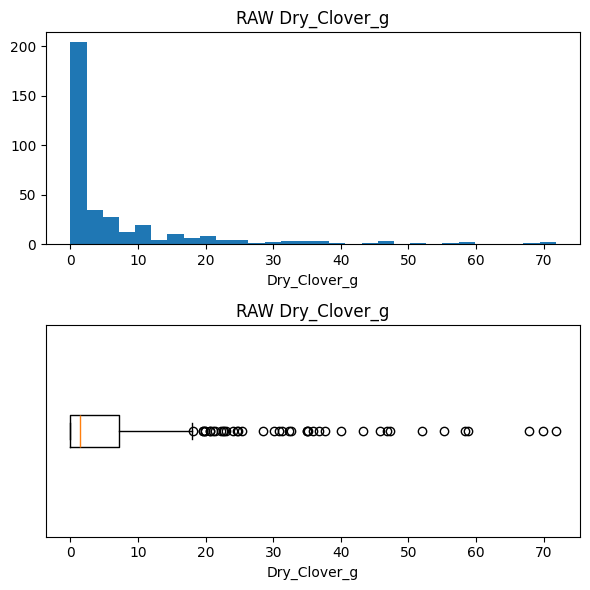

In [379]:

col_Dry_Clover_g = ["Dry_Clover_g"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

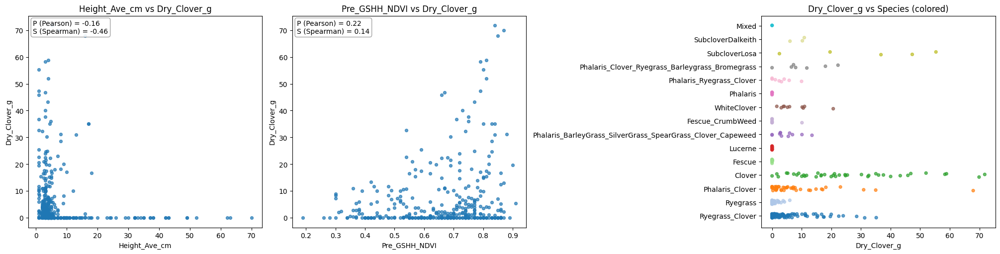

In [380]:
csiro_su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Clover_g")

## 1) What the graphs say (with numbers)

### Distribution shape

* **Zero-inflation is dominant**: the histogram has a huge spike at **$\approx 0$ g**, and the species strip also shows many points exactly on **$0$** across multiple species → so “no clover” cases are common.
* **Strong right tail / outliers**: values extend to about **$\sim 70$–$72$ g** (boxplot points far to the right). Most non-zero points are small (roughly **$0$–$10$ g**), but there are rare large clover masses.

### Relationship with Height

From your plot:

* **Pearson $P \approx -0.16$**, **Spearman $S \approx -0.46$** between **Height** and **Dry_Clover_g**.

  * Interpretation: *globally*, the relationship is **not a clean increasing trend**. The **negative Spearman** suggests that as height increases, clover mass often does **not** increase (and may decrease), which is consistent with “tall canopy = more grass/green total” and clover being suppressed in those regimes.
  * Also visible: **many $0$ values at all heights**, so height alone cannot “turn clover on”.

### Relationship with NDVI

From your plot:

* **Pearson $P \approx 0.22$**, **Spearman $S \approx 0.14$** between **NDVI** and **Dry_Clover_g**.

  * Interpretation: NDVI has **only a weak positive association** with clover mass. NDVI mostly tracks greenness/biomass broadly, not clover specifically.

### Species effect (very important here)

* The species-colored strip shows **different clover ranges by species / mixture labels**: some species groups have more non-zero and higher clover mass, while others are mostly near **$0$**.
* Because your dataset is **imbalanced by species**, any “overall” trend (like the correlations above) is **dominated by the top species**. So clover is **species-conditioned**, and the model must learn “when clover exists” **given species context**.

**Practical summary:** `Dry_Clover_g` is a **two-regime target**:

1. **presence/absence** (many zeros), and
2. **amount** (heavy-tailed positive values up to $\sim 70$ g).
   Height/NDVI are **weak** signals for clover amount, and species is a **strong contextual driver**.


## 2) Data prep recommendations (clover-aware)

### A) Split correctly (avoid leakage / distribution shift)

* Do **stratified splitting** by **`Species × (clover_present)`** at minimum.
* Better: **`Species × Height-bin × NDVI-bin × (clover_present)`** so each split has similar “clover present vs absent” balance **within each species**.

### B) Make an explicit label: `clover_present`

* Define: `clover_present = 1 if Dry_Clover_g > 0 else 0`.
* Track its prevalence **per species** (some species may be near-always 0 → that’s crucial).

### C) Transform the amount target (only for positives)

* For the regression amount, use:

  * `clover_amount = log1p(Dry_Clover_g)` (works well for the long tail).
* Keep the original raw value only for reporting (inverse with `expm1`).

### D) Audit the tail (data quality check)

* For each species, inspect the **top ~1–5%** `Dry_Clover_g` samples (those near 40–70g):

  * confirm they are real (not labeling/ROI mistakes).
* This matters because rare extremes can dominate training if you don’t use robust loss.


## 3) Modeling hints (what tends to work best for this target)

### A) Use a **two-head (hurdle) model** for clover

This matches your plots (tons of zeros + heavy tail):

1. **Presence head**: predicts $p(\text{clover}>0)$
2. **Amount head**: predicts $\log(1+\text{clover})$ **only when clover is present**

This is usually much better than forcing one regressor to learn both regimes.

### B) Species conditioning is mandatory

Feed species as an input (embedding is best):

* `fused = [image_features, Height, NDVI, species_embedding]`

Because your species plot shows clear shifts, the model needs species context to interpret the same NDVI/height differently.

### C) Add interaction capacity

Because clover behavior differs by species:

* Let the MLP see `(Height, NDVI, species_emb)` **together**, or explicitly add:

  * `Height * species_emb`, `NDVI * species_emb`
    This helps the model learn “clover vs not” thresholds and trends that change by species.

### D) Constrain outputs

* Ensure the final clover prediction cannot go negative:

  * if predicting raw: use `softplus`
  * if predicting log1p: output can be any real, but inverse uses `expm1` and clamp at 0.


## 4) Loss function hints (the key part for Dry_Clover_g)

### A) Presence loss

* Use **BCEWithLogitsLoss** on `clover_present`.
* If positives are rare overall (likely), use:

  * **pos_weight** in BCE, or
  * **Focal loss** (helps when “all zeros” is an easy shortcut).

### B) Amount loss (masked)

* Only compute amount loss for `clover_present == 1`.
* Use **SmoothL1 / Huber** on `log1p(Dry_Clover_g)` (robust to outliers up to ~70g).

### C) Balance the two losses

A simple stable combo:

* `L = λ_cls * L_presence + λ_reg * L_amount_masked`
  Typical starting point: `λ_cls = 1.0`, `λ_reg = 1.0`, then tune so neither dominates.

### D) Species-imbalance protection (important with your dataset)

Because top species dominate, consider one of:

* **species-weighted losses** (sample weight $\propto 1/\text{count(species)}$, clipped), or
* macro-averaging: compute loss per species then average across species.

This prevents the model from learning clover behavior only for the big species groups.


If you want, I can also give you a **clean PyTorch implementation** of the **hurdle head + masked SmoothL1 + BCE(pos_weight)** specifically for `Dry_Clover_g`, plugged into your current multitask setup (minimal changes).


## **Dry_Dead_g**

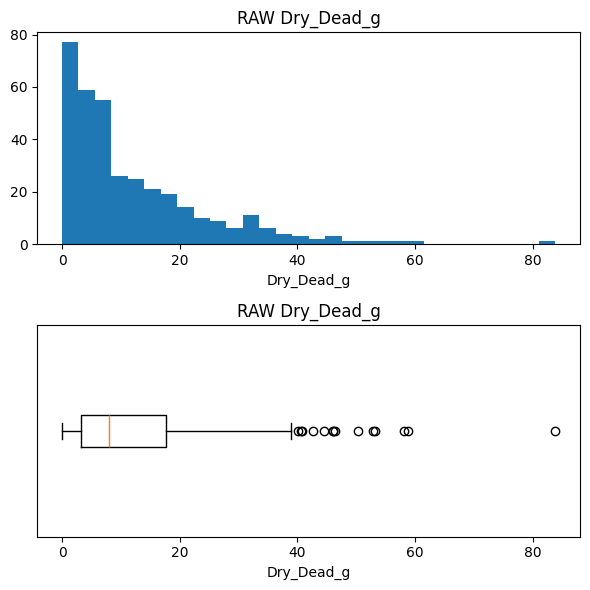

In [ ]:
col_Dry_Clover_g = ["Dry_Dead_g"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

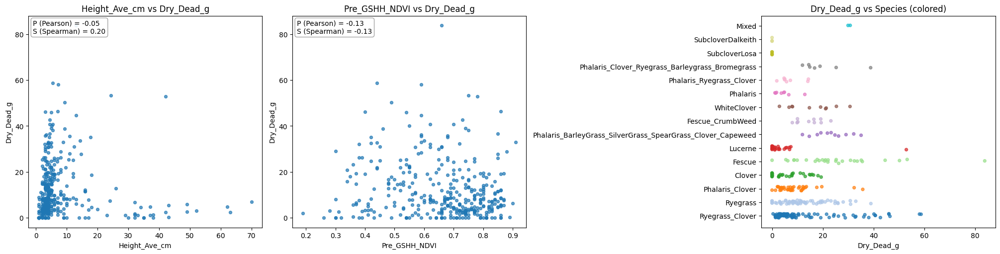

In [388]:
csiro_su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Dead_g")

## 1) What the graphs are saying (with numbers)

### Distribution shape

* **Strong right-skew / long tail**: most samples are in the **~0–20 g** zone, but there are **rare large outliers** reaching **~80–85 g** (you have a point near ~82 g).
* Boxplot shows the “typical” spread is much smaller than the max:

  * median is in the **single-digit grams** range (roughly ~5–10 g by eye),
  * upper whisker goes to roughly **~40 g**,
  * then **sparse outliers** around **~45–60 g** and one around **~82 g**.

### Relationship with Height (weak / inconsistent)

* From your plot annotation: **$P=-0.05$**, **$S=0.20$**.

  * This means **almost no linear relationship** (Pearson ~0),
  * and only a **very weak monotonic tendency** (Spearman 0.20).
* Visually: **high Dry_Dead_g happens mostly at low heights**, but *low height does not imply high dead* (lots of low-height points also have near-zero dead). So height alone can’t pin it down.

### Relationship with NDVI (weak negative)

* From your plot annotation: **$P=-0.13$**, **$S=-0.13$** (both weak).
* Visually: at **higher NDVI (~0.7–0.9)** you mostly see **low dead**, but there are still many low-dead points everywhere → NDVI is only a mild “healthiness” hint, not a strong predictor.

### Species effects exist, but are easy to misread due to imbalance

* The species-colored plot shows **species-specific bands/spreads** (some species show broader dead ranges, and the rare extreme outliers appear in only a few labels).
* But remember your dataset is **imbalanced** (top species dominate: *Ryegrass_Clover 98 (27.5%), Ryegrass 62 (17.4%)*, etc.), so any “overall” behavior will be heavily driven by those.

**Net takeaway for Dry_Dead_g:**
This target looks like **a weakly-driven, high-variance target** from Height/NDVI alone, with **rare but important high outliers** and **species-specific regimes**.


## 2) Data prep recommendations (Dry_Dead_g specific)

### A) Use a heavy-tail transform (helps the long tail)

* Strongly consider training on **$y'=\log(1+y)$** for Dry_Dead_g.

  * It compresses the 0–85 g span so the model doesn’t “chase” outliers.
  * You can still evaluate by inverse-transforming: $y=\exp(y')-1$.

### B) Audit the extreme tail (because it’s sparse)

* Pull the **top 1–2% Dry_Dead_g** samples (e.g., >~60 g-ish in your plot) and visually check:

  * are these real “dead-heavy” quadrats,
  * or label/ROI/harvest-entry issues?
* This matters because **a handful of points can dominate loss** if you don’t use robust losses.

### C) Species-aware splitting (so the tail doesn’t leak)

* If you do random splits, it’s easy that **one split accidentally gets most of the 50–85 g tail** (then val/test will look “hard” or “easy” by chance).
* Minimum safe split rule: **stratify by Species**, and ideally also by a coarse **Dead-bin** (example bins: `0–5`, `5–20`, `20–40`, `>40`), *within each species* if counts allow.


## 3) Modeling hints (what actually helps Dry_Dead_g)

### A) Don’t expect Height/NDVI to do much alone

Your correlations (**$P=-0.05$, $S=0.20$ with height; $P=S=-0.13$ with NDVI**) say this plainly:

* **Dry_Dead_g likely needs image cues** (senescence/brown material, litter, dry patches, shadows, soil exposure patterns).

So:

* keep Height + NDVI, but treat them as **context features**, not primary drivers for this head.

### B) Make the head species-conditioned

Because the species plot shows different spreads:

* feed **species embedding** (or one-hot) into the regression head:

  * `fused = [image_features, height, ndvi, species_emb]`
* For a small extra gain, allow interactions:

  * add `height * species_emb` and `ndvi * species_emb` (or just let an MLP over `[height, ndvi, species_emb]` learn it).

### C) Consider a 2-stage “presence + amount” only if zeros dominate

If you see lots of exact zeros (common in dead/clover-style targets), a hurdle can help:

1. `dead_present = 1(y > 0)`
2. `dead_amount` regression **only when present**
   If zeros are *not* dominant (your histogram suggests many low-but-nonzero values), then simple regression on log1p is often enough.


## 4) Loss function hints (Dry_Dead_g specific)

### Best default combo (works well for this shape)

* Train on **$\log(1+y)$** and use **Huber / SmoothL1** loss.

  * Why: you have rare 40–85 g values; Huber prevents a few outliers from steering the whole model.

### If you care a lot about the upper tail

(Example: you want to be good specifically when dead biomass is high)

* Add a **tail-aware weighting** *after* log1p:

  * upweight samples above a threshold (e.g., `y > 40 g`) modestly (not huge), or
* use a **quantile loss** (pinball) for a high quantile (e.g., 0.7–0.9) as an auxiliary objective.

### Keep expectations realistic

Given the weak correlations with NDVI/height, it’s normal that Dry_Dead_g will have:

* lower ceiling than Dry_Total_g / Dry_Green_g,
* bigger dependence on image quality/seasonal cues.


## **Dry_Green_g**

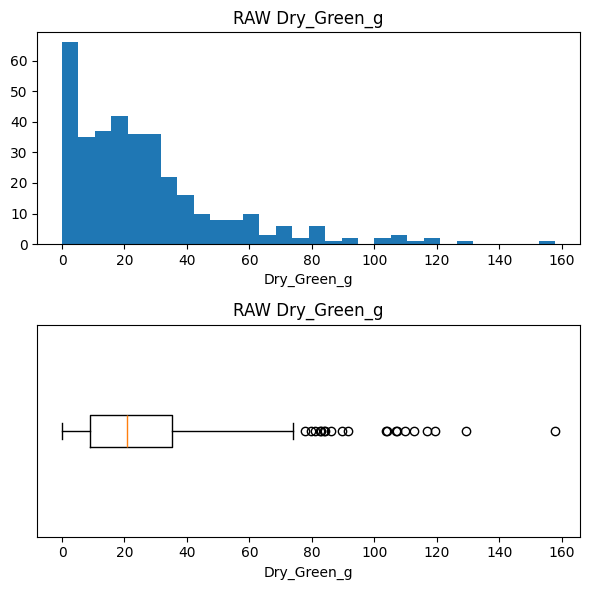

In [389]:
col_Dry_Clover_g = ["Dry_Green_g"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

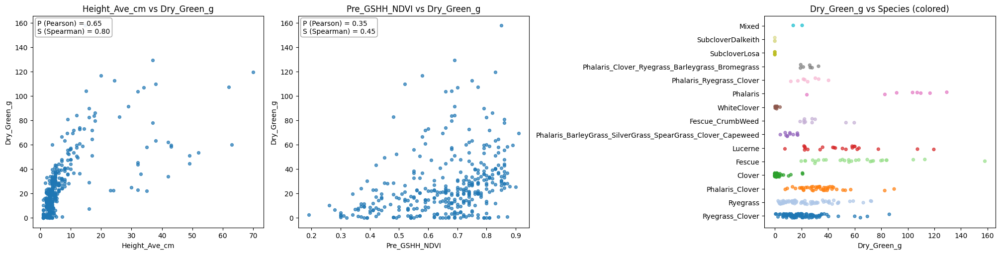

In [390]:
csiro_su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Green_g")

## Dry_Green_g — analysis + practical recommendations

### 1) What the graphs are telling you (with numbers)

**Shape / distribution**

* **Strong right-skew + long tail**: most samples sit in the **low–mid range (~0–40 g)**, but you have **rare large values reaching ~160 g** (hist + boxplot show many outliers beyond the upper whisker).
* This means a plain MSE-on-raw will get dominated by a small number of big points.

**Relationship to Height (strong + monotonic)**

* Your scatter reports **Pearson $P \approx 0.65$** and **Spearman $S \approx 0.80$** for **Height vs Dry_Green_g**.
* Interpretation: Dry_Green rises with height in a **strong, monotonic** way (Spearman high), even if the relationship isn’t perfectly linear (Pearson lower than Spearman).

**Relationship to NDVI (moderate)**

* Your scatter reports **$P \approx 0.35$** and **$S \approx 0.45$** for **NDVI vs Dry_Green_g**.
* Interpretation: NDVI helps, but **much weaker than Height** for Dry_Green in your dataset.

**Species effect (different regimes)**

* The “Dry_Green vs Species” panel shows **species-dependent bands/spreads** (different typical ranges and outliers by species).
* Also your dataset is **imbalanced** (top-4 species ≈ **67.9%** of samples), so **global trends + loss are dominated by those big species** unless you correct for it.


### 2) Data prep hints (Dry_Green specific)

**Target transform**

* Use **$y=\log(1+y)$** for Dry_Green_g (you have a long tail up to ~160 g).

  * This compresses extremes so the model learns the whole range, not just the rare large values.

**Splits (avoid “easy/hard split” artifacts)**

* Stratify splits by **Species × Height-bin × NDVI-bin** (because Dry_Green depends strongly on height and species, and NDVI adds another shift).
  Example bins: Height `0–3, 3–7, 7–15, >15 cm`; NDVI `<0.3, 0.3–0.5, 0.5–0.7, >0.7`.

**Imbalance handling**

* Because top species dominate, do **one** of:

  * **WeightedRandomSampler** with weight $\propto 1/\text{count(species)}$ (clip max weight), **or**
  * **species-weighted loss** (same weighting idea), **or**
  * compute loss as **macro-average across species** (mean loss per species, then average).

**Tail auditing**

* Inspect the **top 1–5% Dry_Green** cases (e.g., >~100 g) **within each species**. Make sure they aren’t label/ROI issues—those points can drive training.


### 3) Modeling hints (what usually works best here)

**Species conditioning is not optional**

* Feed **species as an embedding** and fuse it with image + numeric inputs:

  * `fused = [image_features, height, ndvi, species_emb]`

**Make the interaction learnable**

* Because “same height” can imply different biomass across species, add explicit interaction capacity:

  * include **$height \times species_emb$** and **$ndvi \times species_emb$** (or an MLP that takes `[height, ndvi, species_emb]` jointly).
* This directly targets the regime shifts you’re seeing in the species panels.

**Expect height to carry most of the numeric signal**

* Given **$S \approx 0.80$** (height) vs **$S \approx 0.45$** (NDVI), the model should treat height as a primary driver for Dry_Green, with NDVI as a secondary modulator.

**Evaluate correctly**

* Report **overall + per-species** $R^2$/MAE for Dry_Green, otherwise you can look “good” only because the model fits the dominant species well.


### 4) Loss function hints (Dry_Green specific)

**Robust regression on transformed scale**

* Use **Huber / SmoothL1** on $\log(1+\text{Dry\_Green\_g})$.

  * Why: you have many outliers (tail up to ~160 g); robust loss prevents a few large points from dominating.

**Option: emphasize ranking/monotonicity**

* Since **Spearman is high ($\approx 0.80$)**, adding a small auxiliary term that encourages correct ordering (optional) can help, but usually **SmoothL1 on log1p** is already strong.

**If you’re optimizing the competition metric**

* Your scoring weights give Dry_Green **0.1**, so it’s not the biggest lever compared to Dry_Total (0.5). Still: a stable Dry_Green head helps multi-task learning and improves shared features.

## **Dry_Total_g**

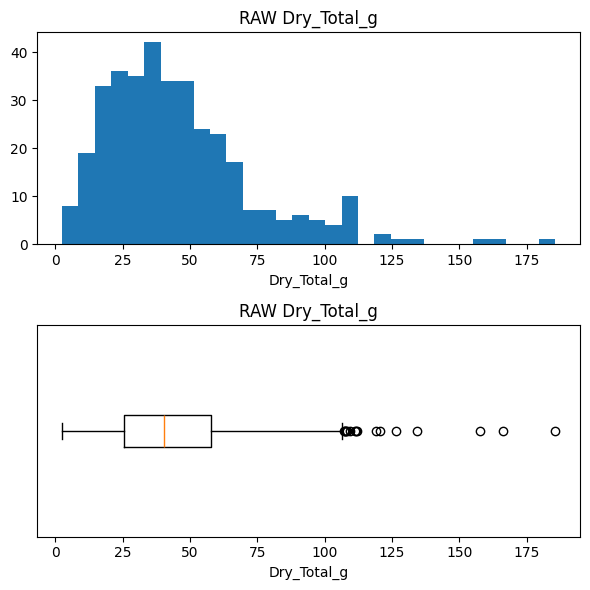

In [391]:
#  "Dry_Total_g", "GDM_g"

col_Dry_Clover_g = ["Dry_Total_g"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

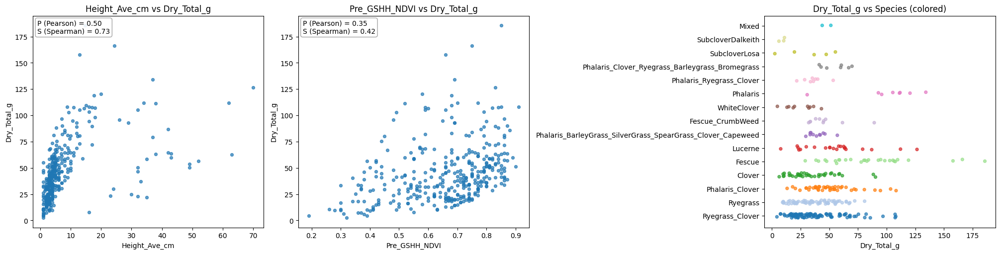

In [395]:
csiro_su.plot_target_vs_height_ndvi_species(full_df, target_col="Dry_Total_g")

## 1) What the graphs say (with supporting values)

### Relationship to Height

* Your plot shows **P (Pearson) = 0.50** and **S (Spearman) = 0.73** for **Height vs Dry_Total_g**.
* Interpretation:

  * **Spearman 0.73 is strong** → as height increases, Dry_Total_g generally increases (good monotonic signal).
  * **Pearson 0.50 is only moderate** → relationship is **not clean-linear** (likely curved + heteroskedastic: spread increases with height).
* Visually: low heights (≈0–10 cm) contain many points but mostly **lower-to-mid biomass**, while higher heights include **much larger spread** and the high-biomass tail.

### Relationship to NDVI

* Your plot shows **P = 0.35**, **S = 0.42** for **NDVI vs Dry_Total_g**.
* Interpretation:

  * NDVI has a **weaker but real** positive relation to Dry_Total_g.
  * NDVI alone won’t pin biomass well; it’s more of a **supporting cue** than the main driver.

### Species effect (conditional shift)

* The **species-colored strip** shows **different ranges** of Dry_Total_g by species: some species rarely reach the extreme tail, while others do.
* So the same height/NDVI can imply **different Dry_Total_g** depending on species → this is exactly why **species conditioning** helps.

### Distribution shape (target difficulty)

* Dry_Total_g is **right-skewed with a long tail**: dense middle region + outliers reaching **~180–190 g**.
* This means:

  * Plain MSE on raw grams will be dominated by a small number of large values.
  * You want a loss/transform that doesn’t let those few points control training.

### Scoring importance (from CSIRO evaluation)

* Dry_Total_g weight is **0.5** (largest), vs 0.2 for GDM_g and 0.1 for each of Dry_Green_g / Dry_Dead_g / Dry_Clover_g.
* So improvements on Dry_Total_g typically move leaderboard the most.

## 2) Data prep recommendations (practical + high impact)

**Transform the target**

* Train on `log1p(Dry_Total_g)` (and optionally standardize after that).
  This compresses the 0–190 g range and makes errors more “relative” instead of “absolute”.

**Outlier audit (don’t blindly delete)**

* Inspect the top tail (e.g., top ~1–2%) **within each species**:

  * If extreme Dry_Total_g happens mostly in certain species/conditions, it’s real signal.
  * If a few points look suspicious (bad harvest/label/entry), consider **winsorizing** (clipping) *only those obvious anomalies*.

**Split correctly (prevents fake validation gains)**

* Use stratified split by **Species × Height-bin × NDVI-bin**.

  * Because height ranges are species-dependent, random split can accidentally place “tall species” mostly in one split → unstable validation.

**Handle species imbalance**

* Top species dominate the dataset, so the model can overfit “major species rules.”
* Use either:

  * **WeightedRandomSampler** (inverse-frequency, with a cap), or
  * sample weights in loss (species-balanced), while keeping Dry_Total weight priority.

## 3) Modeling hints (specific to what your plots imply)

**Make the model explicitly species-conditioned**

* Use a **species embedding** and concatenate with image features + NDVI + height:

  * `fused = [img_feat, height, ndvi, species_emb]`

**Force interactions (because slopes differ by species)**

* Add interaction features (simple and effective):

  * `height * species_emb`, `ndvi * species_emb`
* This helps the model learn: “20 cm means different biomass for different species.”

**Nonlinearity matters (Pearson vs Spearman gap)**

* Since **S(0.73) >> P(0.50)**, relationship is monotonic but not linear.
* So your head should be a small MLP (not a single linear layer), or use a slightly richer regressor block for numeric fusion.

**Dry_Total head deserves priority**

* Because evaluation weight is **0.5**, you can:

  * give Dry_Total_g a slightly larger head capacity, and/or
  * weight its loss more strongly (aligned with scoring).

## 4) Loss function hints (stable training + aligned to evaluation)

**Train loss on transformed target**

* Good default:

  * **SmoothL1 (Huber)** on `log1p(Dry_Total_g)`
    (Write it like this to avoid KaTeX underscore issues: don’t put `Dry_Total_g` inside `$...$`.)

Why:

* SmoothL1 reduces the influence of extreme tail points (your ~180–190g region).
* `log1p` prevents high-gram samples from dominating gradients.

**Weighting to match leaderboard**

* Since scoring weights Dry_Total_g at **0.5**, reflect that in multitask loss. For example:

  * loss_total = `0.5 * loss_dry_total + 0.2 * loss_gdm + 0.1*(others...)`
* This usually beats “equal weights” because it optimizes what the metric rewards.

**One extra trick (optional, often helps)**

* If high biomass matters a lot, add a small **relative-error-style** component on raw scale, e.g. penalize `(pred-true)/(true+eps)` lightly.
  Keep it small—your primary should still be SmoothL1 on `log1p`.


## **GDM_g**

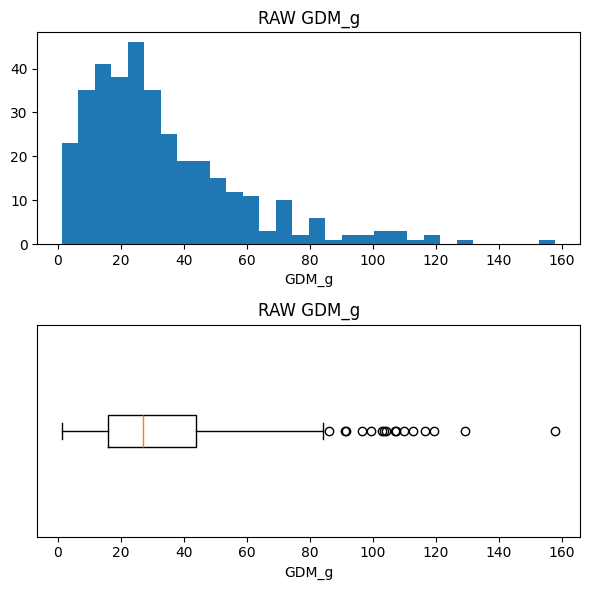

In [394]:
# "Dry_Green_g", "Dry_Total_g", "GDM_g"

col_Dry_Clover_g = ["GDM_g"]
csiro_su.plot_distributions(full_df, col_Dry_Clover_g)

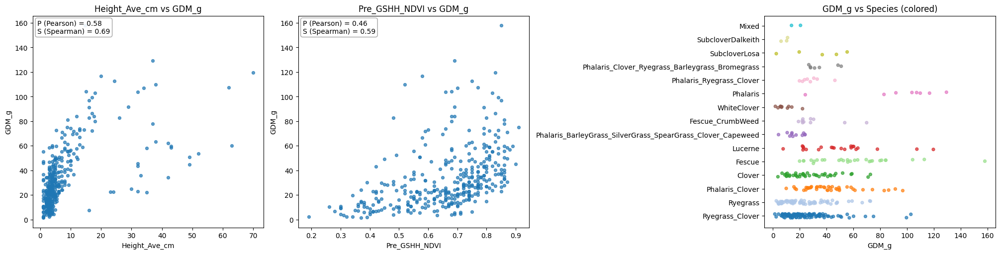

In [396]:
csiro_su.plot_target_vs_height_ndvi_species(full_df, target_col="GDM_g")

## 1) Descriptive observations (with supporting values)

### A) GDM_g is right-skewed with a long tail

* Histogram + boxplot show **most samples concentrated at low–mid values** (roughly in the first ~50g), with a **long tail extending to ~160g**.
* The boxplot shows **many high outliers** (a dense cluster around ~90–120g and a few reaching ~160g).
  **Meaning:** training on raw scale will be dominated by rare large values unless you robustify.

### B) Height is a strong driver of GDM_g (stronger than NDVI)

From the plot annotation:

* **Height_Ave_cm vs GDM_g**

  * **Pearson (P) = 0.58**
  * **Spearman (S) = 0.69**
    **Interpretation:** strong monotonic relationship (S is high) + reasonably linear trend (P is decent). Height is a very informative signal for GDM.

### C) NDVI is also informative, but weaker than Height

From the plot annotation:

* **Pre_GSHH_NDVI vs GDM_g**

  * **Pearson (P) = 0.46**
  * **Spearman (S) = 0.59**
    **Interpretation:** NDVI has a clear monotonic association with GDM, but with more scatter than Height.

### D) Species clearly shifts the GDM scale (species is not “just metadata”)

* The “GDM_g vs Species” panel shows **distinct horizontal bands by species** and **very different max ranges**.
* Combined with your known imbalance (top species dominate), your **global** correlations and losses will be biased toward the dominant species behavior.
  **Meaning:** you need species conditioning + imbalance handling, otherwise the model becomes “great for common species, weak for rare”.

## 2) Data prep recommendations / hints (GDM_g)

### A) Transform the target to reduce tail dominance

* Use **log1p** on the target (in code terms: `log1p(GDM_g)`) before standardization.
* This will:

  * shrink the extreme tail (the ~100–160g region),
  * stabilize gradients,
  * usually improve weighted $R^2$ behavior (because large residuals won’t explode).

### B) Stratified split that respects species + coverage

Do **not** rely on a plain random split. For GDM especially:

* Stratify by **Species × Height-bin × NDVI-bin** so each split has comparable “tall/high-NDVI” coverage inside each species.

### C) Don’t let rare big values all fall in one split

Because the tail is sparse:

* Ensure the **largest GDM samples are not concentrated in validation/test** (or only in train).
  A simple check: top 1–2% GDM values → verify they appear across splits.

### D) Species imbalance mitigation (important for fair performance)

Given your earlier counts (top-4 ~68%):

* Use **WeightedRandomSampler** (or a **species-weighted loss**) so GDM learning isn’t dominated by Ryegrass/Ryegrass_Clover-type majority behavior.

## 3) Modeling hints (GDM_g)

### A) Make species a conditioning input (mandatory)

Because the species plot shows scale shifts:

* Use **species embedding** (recommended) and fuse with your image + numeric features.

### B) Explicitly model interactions: species × (height, NDVI)

Since “same height/NDVI” can map to different GDM by species:

* Add an interaction pathway, e.g. an MLP that takes `[height, NDVI, species_emb]` jointly,
* or explicitly include `height ⊗ species_emb` and `ndvi ⊗ species_emb` (even a simple multiply helps smaller heads).

### C) Expect diminishing returns from NDVI/Height alone

Your correlations show:

* Height and NDVI explain a lot (S up to **0.69**), but the scatter indicates **image cues** still matter (density, senescence, gaps, texture).
  So:
* Use height+NDVI as **strong priors**, but let the CNN carry the residual complexity.

### D) Multi-task helps GDM (because it’s “total mass-like”)

GDM behaves similarly to Dry_Total / Dry_Green in shape and drivers.

* Sharing trunk features across these targets typically improves GDM stability (especially when you train on transformed scale).

## 4) Loss function hints (GDM_g)

### A) Train on transformed target + robust regression loss

Given heavy tail + outliers:

* Use **SmoothL1 (Huber)** on the **transformed** target (i.e., `log1p(GDM_g)` in code terms).

Why:

* MSE over-penalizes tail errors → model chases rare extremes.
* SmoothL1 keeps learning stable while still caring about big misses.

### B) Tail-aware weighting (optional, but often helpful)

If the model under-predicts high-GDM samples after log1p:

* Use a mild **value-based weight** (clipped) so the top tail still matters, e.g. weight proportional to transformed target magnitude, but capped to avoid instability.

### C) Keep evaluation goal in mind (weighted $R^2$)

Your competition weights give **GDM_g weight = 0.2** (important, but not as dominant as Dry_Total at 0.5).

* So: robust loss + good calibration helps overall score more than aggressively fitting the top outliers.


# **Data-prep checklist**


Below is a **data-prep checklist** tailored to what your graphs are saying about these targets:

* `Dry_Dead_g` (very right-skewed, weak relation with height/NDVI)
* `Dry_Clover_g` (very right-skewed + many near-zeros, species effects)
* `Dry_Green_g` (right-skewed but **strong** relation with height + decent NDVI)
* `Dry_Total_g` (moderate-strong relation with height + some NDVI, heavy weight in metric)
* `GDM_g` (similar to Dry_Green_g / Dry_Total_g patterns)

The goal: **maximize weighted $R^2$**, so we prioritize stable learning on the heavily weighted ones (Dry_Total_g=0.5, GDM_g=0.2) while not sacrificing the others.

## 1) Clean + validate rows (before any split)

### 1.1 Remove impossible / inconsistent targets

Do these checks **row-wise** and decide drop vs clip:

* All biomass targets should be $\ge 0$:

  * `Dry_Dead_g`, `Dry_Green_g`, `Dry_Clover_g`, `Dry_Total_g`, `GDM_g`
* If `Dry_Total_g` is supposed to be **sum-like**, sanity check:

  * `Dry_Total_g >= Dry_Green_g + Dry_Dead_g + Dry_Clover_g` (or close)
  * If violated heavily → likely label issue/outlier.

**Action**

* If only a handful: drop those rows.
* If many: clip negatives to 0 and keep (but log it).

## 2) Handle heavy skew + outliers (your hist/boxplots scream this)

Your distributions have long right tails and many small values. If you train in raw grams with MSE, those few huge values dominate gradients and hurt R².

### 2.1 Use `log1p` on *all five biomass targets*

For each target `y` use:

* `y_t = log1p(y)`  (this compresses tail but preserves 0)

This is **especially important** for:

* `Dry_Dead_g`, `Dry_Clover_g` (many near-zero + long tail)
* also helps `Dry_Total_g`, `GDM_g`, `Dry_Green_g`

### 2.2 Winsorize (cap) extreme tail *before* computing normalization stats

Because a few extreme points can distort mean/std even after log.

**Action**

* In transformed space (`log1p`), cap at high percentile:

  * e.g. cap each target at its `p99.5` (or `p99`) computed on **train only**.
* Keep a flag if you want:

  * `is_capped_<target>` (optional, can help debugging)

## 3) Split strategy (super important because species is imbalanced)

Species distribution is skewed (some species very rare). If you random split, you’ll get leakage-like issues or missing species in valid/test.

### 3.1 Use stratified split by `Species`

* Ensure each split has similar species proportions.
* For very rare species (count < ~5–10), you may not be able to distribute perfectly.

**Practical options**

* **Option A (recommended):** Stratified split on Species (best generalization).
* **Option B:** Group rare species into `"Other"` for stratification only (keep original label for model).

Also: fix a `seed` and store split indices.

## 4) Normalization (train-only statistics)

After transform + (optional) cap:

### 4.1 Standardize each target separately

For each target `t`:

* `z = (y_t - mean_t) / std_t`
  Compute `mean_t, std_t` on **train split only**.

Save these stats into a `state["stats"]` dict so you can:

* transform labels during training
* inverse-transform predictions for metrics/R²

## 5) Inputs prep (what to feed the model)

### 5.1 NDVI

NDVI is already bounded-ish (0.2–0.9 in your plot), so:

* **standardize** NDVI (train mean/std) or keep as-is (both work)
* if outliers exist, clamp to plausible range (e.g. [0,1])

### 5.2 Height

Height has a long tail too (some species reach 60–70 cm).

* use `log1p(height)` **or** standardize raw height
* since height is a key driver for Dry_Total/GDM/Dry_Green, make it stable:

  * I’d do `log1p(height)` then standardize.

### 5.3 Species

Species is categorical + imbalanced:

* map to integer IDs (`species2id`)
* feed as:

  * embedding (recommended), or
  * one-hot if few categories

**Important:** keep a consistent mapping across train/valid/test.

## 6) “Two-regime” hint for Dead/Clover (data prep that helps modeling)

From your correlations:

* `Dry_Dead_g` has weak linear relation with height/NDVI overall.
* `Dry_Clover_g` also behaves species-dependent and zero-heavy.

That often means the data behaves like:

* **presence/absence-ish** + **amount when present**.

### 6.1 Add binary indicators (derived from labels, used only during training)

Create extra fields:

* `dead_present = 1[Dry_Dead_g > 0]`
* `clover_present = 1[Dry_Clover_g > 0]`

You can optionally:

* train an auxiliary head for these (classification), or
* just use them to analyze stratification/hard cases

Even if you don’t use extra heads, knowing this helps you choose robust loss.

## 7) Image preprocessing (keep it stable)

You already use resize + ImageNet normalization. Good.

**Data aug** (safe for biomass):

* mild color jitter (illumination variation)
* small random crop/resize
* horizontal flip only if it doesn’t break spatial meaning (usually ok for pasture)

Avoid:

* aggressive geometric warps that distort scale/texture too much.

## 8) Final “prep pipeline order” (copy this order)

1. Load dataframe
2. Basic cleaning: nulls, negatives, impossible combos
3. Split into train/valid/test (stratified by species)
4. Compute train-only caps in `log1p` space (optional)
5. Transform targets: `log1p` → cap → standardize (train stats)
6. Transform inputs: NDVI standardize, height `log1p`+standardize
7. Encode species to IDs
8. Save `state = {stats, caps, species2id, input_norms, target_cfg}`
9. Build datasets/dataloaders

## Strong recommendation (because of the competition metric)

Since weighted $R^2$ gives **0.5 weight to Dry_Total_g** and **0.2 to GDM_g**, your data prep should be optimized first for:

* stable learning on `Dry_Total_g` and `GDM_g`
* which means: **log1p + cap + robust loss** is non-negotiable.

If you want, paste (or point to) your current `prepare_data()` function from the notebook, and I’ll rewrite it into a clean version that implements exactly the above steps (train-only stats, caps, mappings, and returns `state`).
